In [ ]:
!nvidia-smi

Mon Feb 17 15:37:43 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

# Install Depedencies

In [ ]:
!pip install -q gdown inference-gpu
!pip install -q onnxruntime-gpu==1.18.0 --index-url https://aiinfra.pkgs.visualstudio.com/PublicPackages/_packaging/onnxruntime-cuda-12/pypi/simple/

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
transformers 4.48.3 requires tokenizers<0.22,>=0.21, but you have tokenizers 0.20.3 which is incompatible.


In [ ]:
!pip install -q git+https://github.com/roboflow/sports.git



  Preparing metadata (setup.py) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference-gpu 0.37.1 requires tokenizers<=0.20.3,>=0.19.0, but you have tokenizers 0.21.0 which is incompatible.


In [ ]:
!pip uninstall -y supervision && pip install -q supervision>=0.23.0

Found existing installation: supervision 0.25.1
Uninstalling supervision-0.25.1:
  Successfully uninstalled supervision-0.25.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
inference-gpu 0.37.1 requires tokenizers<=0.20.3,>=0.19.0, but you have tokenizers 0.21.0 which is incompatible.


# Sample Video ball and player Detection

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
video_path = "/content/drive/MyDrive/monyet/datauu.mp4"  # Path to your video

In [ ]:
import os
os.environ["ONNXRUNTIME_EXECUTION_PROVIDERS"] = "[CUDAExecutionProvider]"

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
PLAYER_DETECTION_MODEL_ID = "football-players-detection-3zvbc/11"
PLAYER_DETECTION_MODEL = get_model(model_id=PLAYER_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

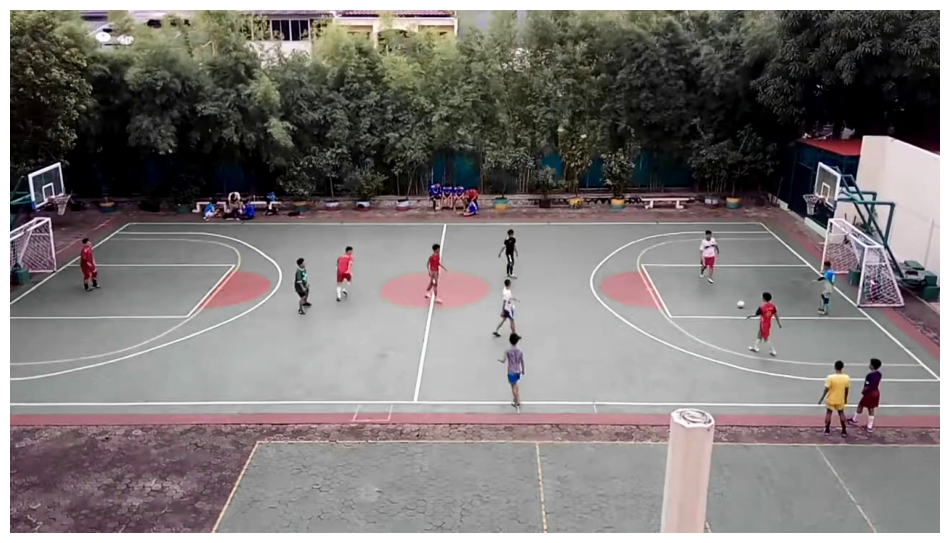

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

sv.plot_image(frame)

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
from ultralytics import YOLO
import os

# Inisialisasi model YOLO
model = YOLO('yolov8n.pt')

# Path input video dan folder output
input_video = "/content/drive/MyDrive/monyet/datauu.mp4"
output_folder = "/content/drive/MyDrive/monyet"

# Membuat folder jika belum ada
os.makedirs(output_folder, exist_ok=True)

# Melakukan prediksi dan menyimpan video hasilnya
results = model.predict(input_video, save=True, save_dir=output_folder)

# Menampilkan hasil prediksi
print(results[0])
print('=====================================')
for box in results[0].boxes:
    print(box)

print(f"Output video disimpan di folder: {output_folder}")

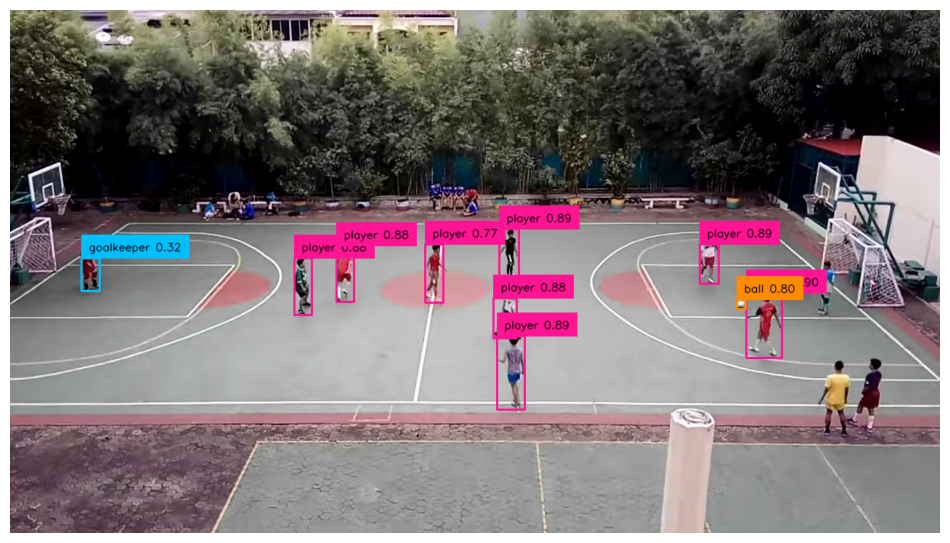

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"

box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

#bounding box dari Yolo untuk confidence
result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

labels = [
    f"{class_name} {confidence:.2f}"
    for class_name, confidence
    in zip(detections['class_name'], detections.confidence)
]

annotated_frame = frame.copy()
annotated_frame = box_annotator.annotate(
    scene=annotated_frame,
    detections=detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=detections,
    labels=labels)

sv.plot_image(annotated_frame)


In [ ]:
import supervision as sv
import pandas as pd
import cv2
import os



# 2. Tentukan path video dan folder penyimpanan di Google Drive
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
drive_folder = "/content/drive/MyDrive/dataset"

# 3. Pastikan folder ada, jika tidak, buat foldernya
if not os.path.exists(drive_folder):
    os.makedirs(drive_folder)

# 4. File CSV untuk menyimpan confidence scores
csv_file_path = os.path.join(drive_folder, "confidence_scores.csv")
video_output_path = os.path.join(drive_folder, "annotated_video.mp4")

# 5. Inisialisasi annotator untuk bounding box dan label
box_annotator = sv.BoxAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#FF8C00', '#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000')
)

# 6. Buka video dengan OpenCV untuk mendapatkan informasi resolusi & FPS
cap = cv2.VideoCapture(SOURCE_VIDEO_PATH)
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# 7. Buat writer untuk menyimpan video hasil anotasi (opsional)
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
video_writer = cv2.VideoWriter(video_output_path, fourcc, fps, (width, height))

# 8. Variabel untuk menyimpan data confidence score
confidence_data = []

# 9. Proses setiap frame dalam video
frame_number = 0
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break  # Berhenti jika video selesai

    frame_number += 1
    print(f"Processing frame {frame_number}...")

    # 10. Deteksi objek pada frame menggunakan model YOLOV()
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    # 11. Simpan data confidence per frame
    for class_name, confidence in zip(detections["class_name"], detections.confidence):
        confidence_data.append([frame_number, class_name, confidence])

    # 12. Anotasi frame dengan bounding box & label
    labels = [f"{cls} {conf:.2f}" for cls, conf in zip(detections["class_name"], detections.confidence)]
    annotated_frame = box_annotator.annotate(scene=frame, detections=detections)
    annotated_frame = label_annotator.annotate(scene=annotated_frame, detections=detections, labels=labels)

    # 13. Simpan frame hasil anotasi ke video output
    video_writer.write(annotated_frame)

# 14. Tutup video & writer setelah selesai
cap.release()
video_writer.release()

# 15. Simpan semua confidence scores ke CSV
df = pd.DataFrame(confidence_data, columns=["Frame", "Class", "Confidence"])
df.to_csv(csv_file_path, index=False)

print(f"Confidence scores telah disimpan di: {csv_file_path}")
print(f"Video dengan anotasi telah disimpan di: {video_output_path}")


Processing frame 1...
Processing frame 2...
Processing frame 3...
Processing frame 4...
Processing frame 5...
Processing frame 6...
Processing frame 7...
Processing frame 8...
Processing frame 9...
Processing frame 10...
Processing frame 11...
Processing frame 12...
Processing frame 13...
Processing frame 14...
Processing frame 15...
Processing frame 16...
Processing frame 17...
Processing frame 18...
Processing frame 19...
Processing frame 20...
Processing frame 21...
Processing frame 22...
Processing frame 23...
Processing frame 24...
Processing frame 25...
Processing frame 26...
Processing frame 27...
Processing frame 28...
Processing frame 29...
Processing frame 30...
Processing frame 31...
Processing frame 32...
Processing frame 33...
Processing frame 34...
Processing frame 35...
Processing frame 36...
Processing frame 37...
Processing frame 38...
Processing frame 39...
Processing frame 40...
Processing frame 41...
Processing frame 42...
Processing frame 43...
Processing frame 44.

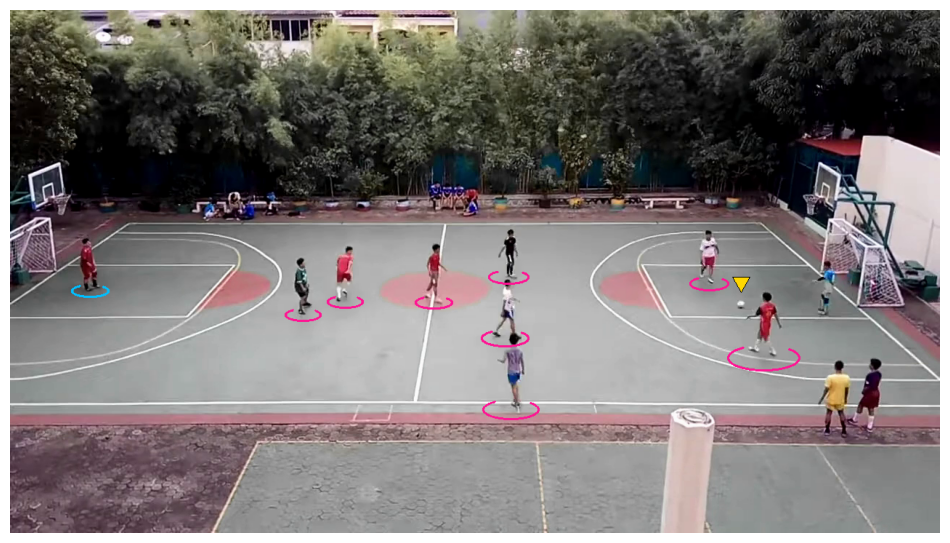

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

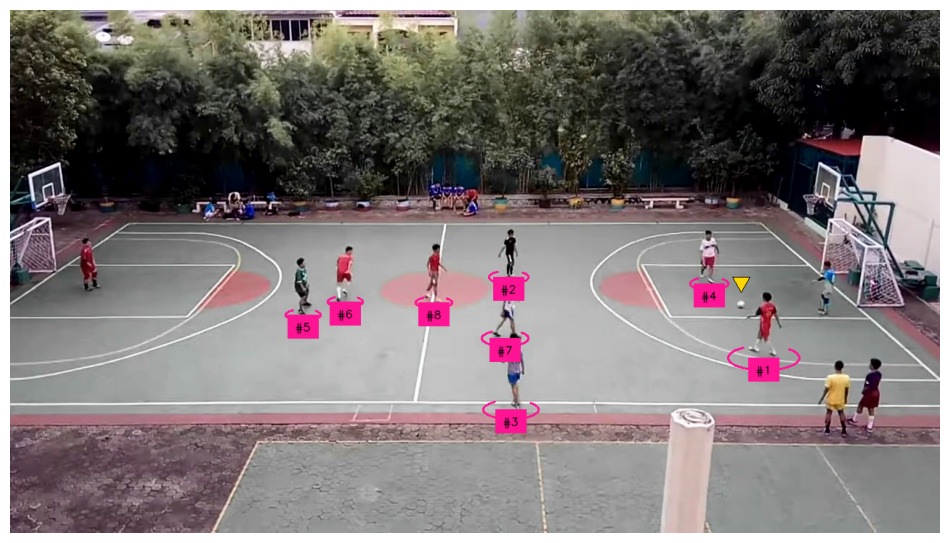

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0

ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections.class_id -= 1
all_detections = tracker.update_with_detections(detections=all_detections)

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

In [ ]:
from tqdm import tqdm

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    detections = detections.with_nms(threshold=0.5, class_agnostic=True)
    detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

collecting crops: 17it [01:01,  3.64s/it]


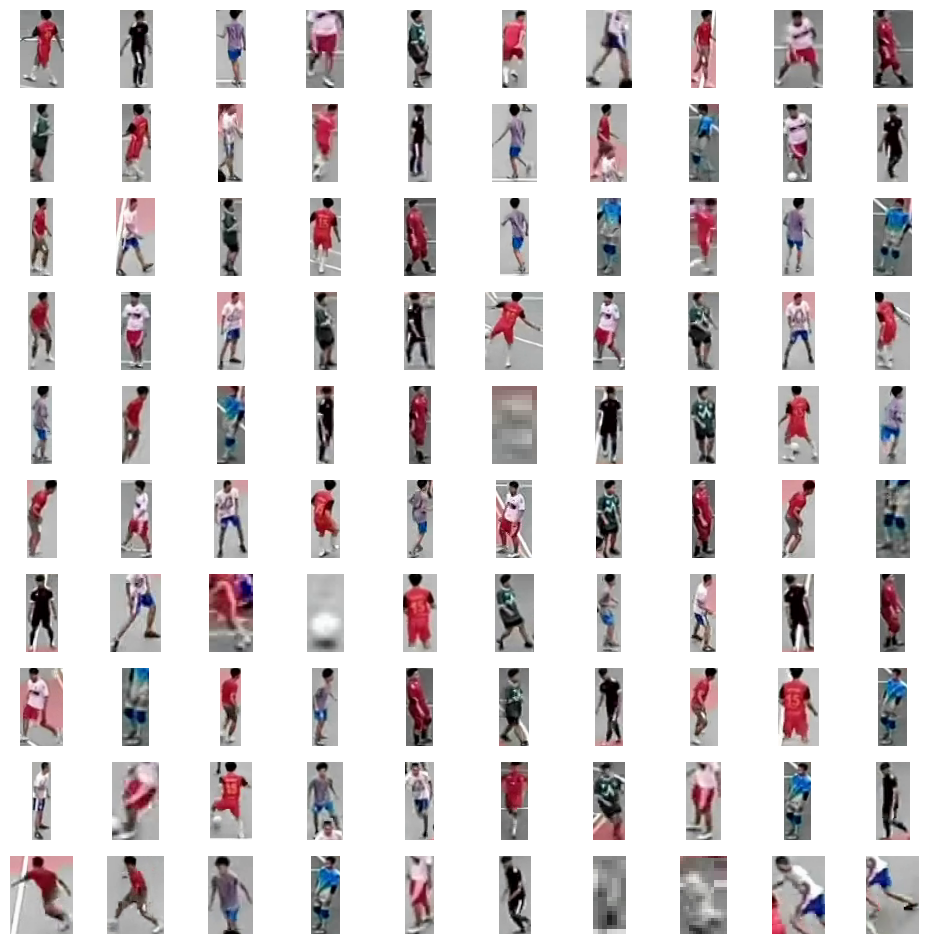

In [ ]:
sv.plot_images_grid(crops[:100], grid_size=(10, 10))

# Using K-Means

In [ ]:
import torch
from transformers import AutoProcessor, SiglipVisionModel

SIGLIP_MODEL_PATH = 'google/siglip-base-patch16-224'

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
EMBEDDINGS_MODEL = SiglipVisionModel.from_pretrained(SIGLIP_MODEL_PATH).to(DEVICE)
EMBEDDINGS_PROCESSOR = AutoProcessor.from_pretrained(SIGLIP_MODEL_PATH)

The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/813M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/368 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/711 [00:00<?, ?B/s]

spiece.model:   0%|          | 0.00/798k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/409 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.40M [00:00<?, ?B/s]

In [ ]:
import numpy as np
from more_itertools import chunked

BATCH_SIZE = 32

crops = [sv.cv2_to_pillow(crop) for crop in crops]
batches = chunked(crops, BATCH_SIZE)
data = []
with torch.no_grad():
    for batch in tqdm(batches, desc='embedding extraction'):
        inputs = EMBEDDINGS_PROCESSOR(images=batch, return_tensors="pt").to(DEVICE)
        outputs = EMBEDDINGS_MODEL(**inputs)
        embeddings = torch.mean(outputs.last_hidden_state, dim=1).cpu().numpy()
        data.append(embeddings)

data = np.concatenate(data)

embedding extraction: 5it [00:02,  1.83it/s]


In [ ]:
import umap
from sklearn.cluster import KMeans

REDUCER = umap.UMAP(n_components=3)
CLUSTERING_MODEL = KMeans(n_clusters=2)

In [ ]:
projections = REDUCER.fit_transform(data)
clusters = CLUSTERING_MODEL.fit_predict(projections)


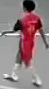
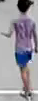
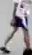
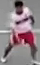
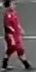
...
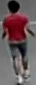
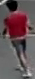
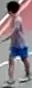
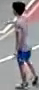
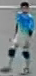

In [ ]:
import plotly.graph_objects as go
import numpy as np
from typing import Dict, List
from IPython.core.display import display, HTML
from PIL import Image
import base64
from io import BytesIO


def pil_image_to_data_uri(image: Image.Image) -> str:
    buffered = BytesIO()
    image.save(buffered, format="PNG")
    img_str = base64.b64encode(buffered.getvalue()).decode("utf-8")
    return f"data:image/png;base64,{img_str}"


def display_projections(
    labels: np.ndarray,
    projections: np.ndarray,
    images: List[Image.Image],
    show_legend: bool = False,
    show_markers_with_text: bool = True
) -> None:
    image_data_uris = {f"image_{i}": pil_image_to_data_uri(image) for i, image in enumerate(images)}
    image_ids = np.array([f"image_{i}" for i in range(len(images))])

    unique_labels = np.unique(labels)
    traces = []
    for unique_label in unique_labels:
        mask = labels == unique_label
        customdata_masked = image_ids[mask]
        trace = go.Scatter3d(
            x=projections[mask][:, 0],
            y=projections[mask][:, 1],
            z=projections[mask][:, 2],
            mode='markers+text' if show_markers_with_text else 'markers',
            text=labels[mask],
            customdata=customdata_masked,
            name=str(unique_label),
            marker=dict(size=8),
            hovertemplate="<b>class: %{text}</b><br>image ID: %{customdata}<extra></extra>"
        )
        traces.append(trace)

    fig = go.Figure(data=traces)
    fig.update_layout(
        scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'),
        width=1000,
        height=1000,
        showlegend=show_legend
    )

    plotly_div = fig.to_html(full_html=False, include_plotlyjs=False, div_id="scatter-plot-3d")

    javascript_code = f"""
    <script>
        function displayImage(imageId) {{
            var imageElement = document.getElementById('image-display');
            var placeholderText = document.getElementById('placeholder-text');
            var imageDataURIs = {image_data_uris};
            imageElement.src = imageDataURIs[imageId];
            imageElement.style.display = 'block';
            placeholderText.style.display = 'none';
        }}

        var chartElement = document.getElementById('scatter-plot-3d');

        chartElement.on('plotly_click', function(data) {{
            var customdata = data.points[0].customdata;
            displayImage(customdata);
        }});
    </script>
    """

    html_template = f"""
    <!DOCTYPE html>
    <html>
        <head>
            <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
            <style>
                #image-container {{
                    position: fixed;
                    top: 0;
                    left: 0;
                    width: 200px;
                    height: 200px;
                    padding: 5px;
                    border: 1px solid #ccc;
                    background-color: white;
                    z-index: 1000;
                    box-sizing: border-box;
                    display: flex;
                    align-items: center;
                    justify-content: center;
                    text-align: center;
                }}
                #image-display {{
                    width: 100%;
                    height: 100%;
                    object-fit: contain;
                }}
            </style>
        </head>
        <body>
            {plotly_div}
            <div id="image-container">
                <img id="image-display" src="" alt="Selected image" style="display: none;" />
                <p id="placeholder-text">Click on a data entry to display an image</p>
            </div>
            {javascript_code}
        </body>
    </html>
    """

    display(HTML(html_template))

display_projections(clusters, projections, crops)

In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

collecting crops: 17it [01:01,  3.63s/it]
Embedding extraction: 5it [00:01,  2.68it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
import numpy as np
import supervision as sv

def resolve_goalkeepers_team_id(
    players: sv.Detections,
    goalkeepers: sv.Detections
) -> np.ndarray:
    goalkeepers_xy = goalkeepers.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    players_xy = players.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    team_0_centroid = players_xy[players.class_id == 0].mean(axis=0)
    team_1_centroid = players_xy[players.class_id == 1].mean(axis=0)
    goalkeepers_team_id = []
    for goalkeeper_xy in goalkeepers_xy:
        dist_0 = np.linalg.norm(goalkeeper_xy - team_0_centroid)
        dist_1 = np.linalg.norm(goalkeeper_xy - team_1_centroid)
        goalkeepers_team_id.append(0 if dist_0 < dist_1 else 1)

    return np.array(goalkeepers_team_id)

Embedding extraction: 1it [00:00,  6.75it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



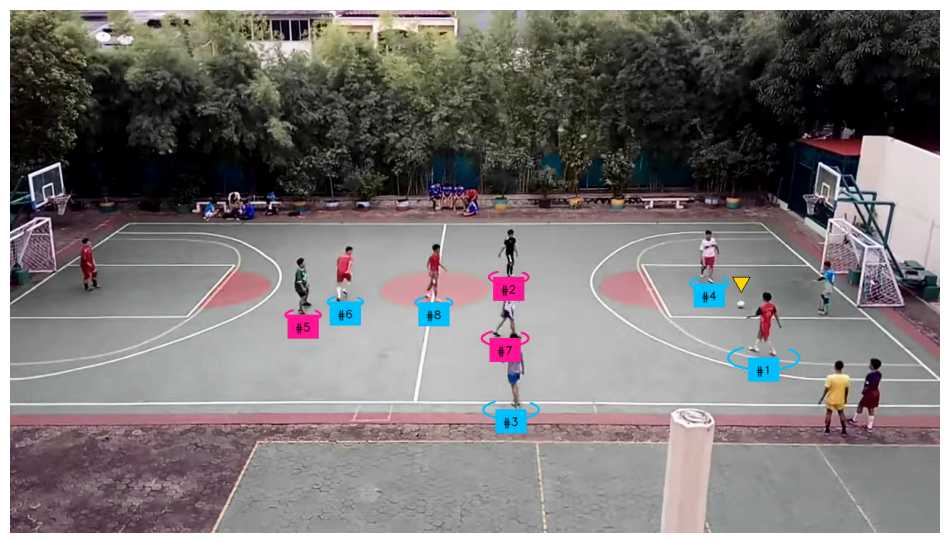

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2


ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=25,
    height=21,
    outline_thickness=1
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

# Pitch Key Point Detection

In [ ]:
from inference import get_model
from google.colab import userdata

ROBOFLOW_API_KEY = userdata.get('ROBOFLOW_API_KEY')
FIELD_DETECTION_MODEL_ID = "football-field-detection-f07vi/14"
FIELD_DETECTION_MODEL = get_model(model_id=FIELD_DETECTION_MODEL_ID, api_key=ROBOFLOW_API_KEY)

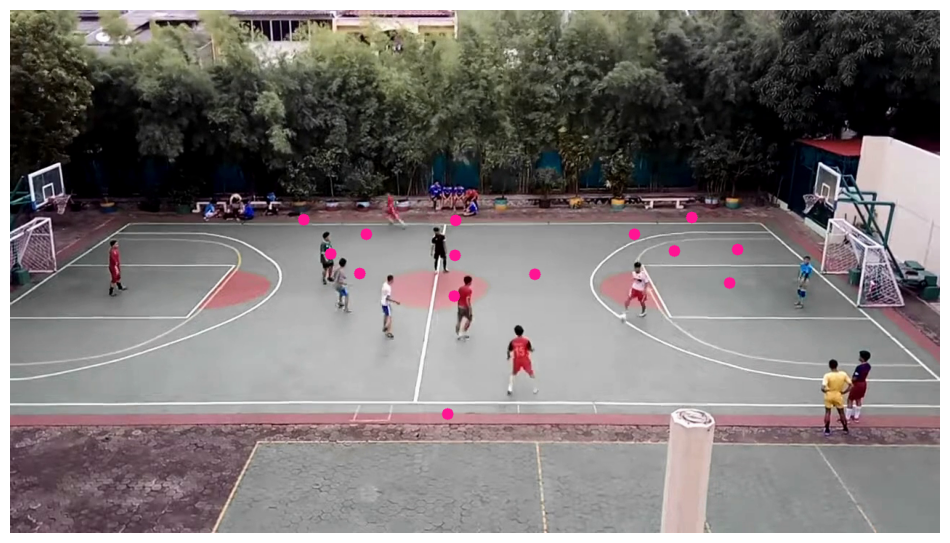

In [ ]:
import supervision as sv

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"

vertex_annotator = sv.VertexAnnotator(
    color=sv.Color.from_hex('#FF1493'),
    radius=8)

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
frame_reference_key_points = sv.KeyPoints(
    xy=frame_reference_points[np.newaxis, ...])

annotated_frame = frame.copy()
annotated_frame = vertex_annotator.annotate(
    scene=annotated_frame,
    key_points=frame_reference_key_points)

sv.plot_image(annotated_frame)

# Tracking Player

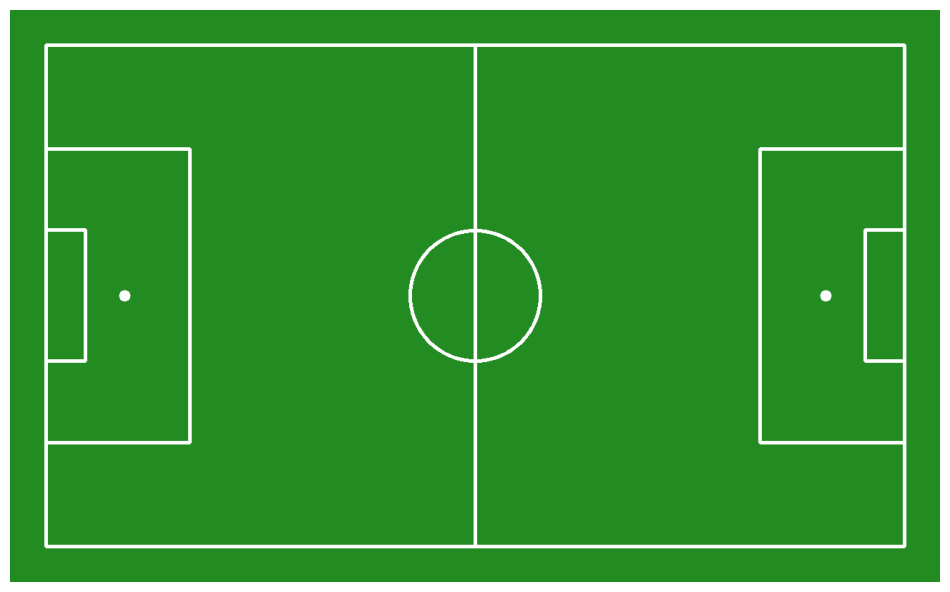

In [ ]:
from sports.annotators.soccer import draw_pitch
from sports.configs.soccer import SoccerPitchConfiguration

CONFIG = SoccerPitchConfiguration()

annotated_frame = draw_pitch(CONFIG)

sv.plot_image(annotated_frame)

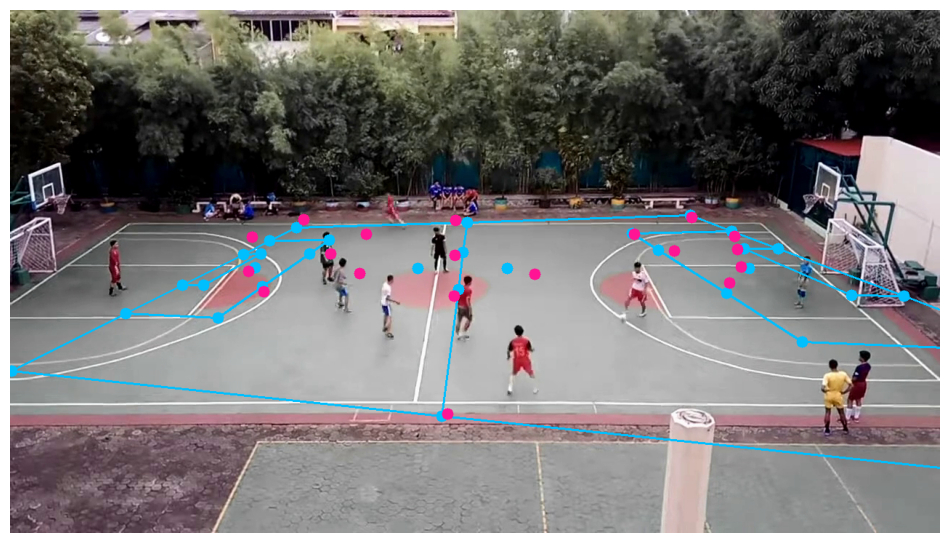

In [ ]:
import numpy as np
import supervision as sv
from sports.common.view import ViewTransformer

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"

# Inisialisasi Annotator
edge_annotator = sv.EdgeAnnotator(color=sv.Color.from_hex('#00BFFF'), thickness=2, edges=CONFIG.edges)
vertex_annotator = sv.VertexAnnotator(color=sv.Color.from_hex('#FF1493'), radius=8)
vertex_annotator_2 = sv.VertexAnnotator(color=sv.Color.from_hex('#00BFFF'), radius=8)

# Ambil frame dari video
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH, start=200)
frame = next(frame_generator)

# Inference model deteksi lapangan
result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# Validasi titik yang memiliki confidence tinggi
filter = key_points.confidence[0] > 0.4  # Bisa dicoba lebih rendah jika terlalu sedikit titik
frame_reference_points = key_points.xy[0][filter]

# Pastikan jumlah titik referensi cukup
if len(frame_reference_points) < 4:
    raise ValueError("Titik referensi lapangan terlalu sedikit. Pastikan model mendeteksi dengan benar.")

# Ambil titik referensi lapangan
frame_reference_key_points = sv.KeyPoints(xy=frame_reference_points[np.newaxis, ...])
pitch_reference_points = np.array(CONFIG.vertices)[filter]

# Transformasi perspektif dengan validasi
try:
    transformer = ViewTransformer(source=pitch_reference_points, target=frame_reference_points)
    pitch_all_points = np.array(CONFIG.vertices)
    frame_all_points = transformer.transform_points(points=pitch_all_points)
    frame_all_key_points = sv.KeyPoints(xy=frame_all_points[np.newaxis, ...])
except Exception as e:
    raise ValueError(f"Kesalahan transformasi perspektif: {e}")

# Anotasi frame
annotated_frame = frame.copy()
annotated_frame = edge_annotator.annotate(scene=annotated_frame, key_points=frame_all_key_points)
annotated_frame = vertex_annotator_2.annotate(scene=annotated_frame, key_points=frame_all_key_points)
annotated_frame = vertex_annotator.annotate(scene=annotated_frame, key_points=frame_reference_key_points)

# Plot hasil akhir
sv.plot_image(annotated_frame)


In [ ]:
import supervision as sv
from tqdm import tqdm
from sports.common.team import TeamClassifier

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
PLAYER_ID = 2
STRIDE = 30

frame_generator = sv.get_video_frames_generator(
    source_path=SOURCE_VIDEO_PATH, stride=STRIDE)

crops = []
for frame in tqdm(frame_generator, desc='collecting crops'):
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)
    players_detections = detections[detections.class_id == PLAYER_ID]
    players_crops = [sv.crop_image(frame, xyxy) for xyxy in detections.xyxy]
    crops += players_crops

team_classifier = TeamClassifier(device="cuda")
team_classifier.fit(crops)

collecting crops: 17it [00:59,  3.49s/it]
Embedding extraction: 5it [00:02,  2.46it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [ ]:
import cv2
from typing import Optional

def draw_pitch_voronoi_diagram_2(
    config: SoccerPitchConfiguration,
    team_1_xy: np.ndarray,
    team_2_xy: np.ndarray,
    team_1_color: sv.Color = sv.Color.RED,
    team_2_color: sv.Color = sv.Color.WHITE,
    opacity: float = 0.5,
    padding: int = 50,
    scale: float = 0.1,
    pitch: Optional[np.ndarray] = None
) -> np.ndarray:
    """
    Draws a Voronoi diagram on a soccer pitch representing the control areas of two
    teams with smooth color transitions.

    Args:
        config (SoccerPitchConfiguration): Configuration object containing the
            dimensions and layout of the pitch.
        team_1_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 1.
        team_2_xy (np.ndarray): Array of (x, y) coordinates representing the positions
            of players in team 2.
        team_1_color (sv.Color, optional): Color representing the control area of
            team 1. Defaults to sv.Color.RED.
        team_2_color (sv.Color, optional): Color representing the control area of
            team 2. Defaults to sv.Color.WHITE.
        opacity (float, optional): Opacity of the Voronoi diagram overlay.
            Defaults to 0.5.
        padding (int, optional): Padding around the pitch in pixels.
            Defaults to 50.
        scale (float, optional): Scaling factor for the pitch dimensions.
            Defaults to 0.1.
        pitch (Optional[np.ndarray], optional): Existing pitch image to draw the
            Voronoi diagram on. If None, a new pitch will be created. Defaults to None.

    Returns:
        np.ndarray: Image of the soccer pitch with the Voronoi diagram overlay.
    """
    if pitch is None:
        pitch = draw_pitch(
            config=config,
            padding=padding,
            scale=scale
        )

    scaled_width = int(config.width * scale)
    scaled_length = int(config.length * scale)

    voronoi = np.zeros_like(pitch, dtype=np.uint8)

    team_1_color_bgr = np.array(team_1_color.as_bgr(), dtype=np.uint8)
    team_2_color_bgr = np.array(team_2_color.as_bgr(), dtype=np.uint8)

    y_coordinates, x_coordinates = np.indices((
        scaled_width + 2 * padding,
        scaled_length + 2 * padding
    ))

    y_coordinates -= padding
    x_coordinates -= padding

    def calculate_distances(xy, x_coordinates, y_coordinates):
        return np.sqrt((xy[:, 0][:, None, None] * scale - x_coordinates) ** 2 +
                       (xy[:, 1][:, None, None] * scale - y_coordinates) ** 2)

    distances_team_1 = calculate_distances(team_1_xy, x_coordinates, y_coordinates)
    distances_team_2 = calculate_distances(team_2_xy, x_coordinates, y_coordinates)

    min_distances_team_1 = np.min(distances_team_1, axis=0)
    min_distances_team_2 = np.min(distances_team_2, axis=0)

    # Increase steepness of the blend effect
    steepness = 15  # Increased steepness for sharper transition
    distance_ratio = min_distances_team_2 / np.clip(min_distances_team_1 + min_distances_team_2, a_min=1e-5, a_max=None)
    blend_factor = np.tanh((distance_ratio - 0.5) * steepness) * 0.5 + 0.5

    # Create the smooth color transition
    for c in range(3):  # Iterate over the B, G, R channels
        voronoi[:, :, c] = (blend_factor * team_1_color_bgr[c] +
                            (1 - blend_factor) * team_2_color_bgr[c]).astype(np.uint8)

    overlay = cv2.addWeighted(voronoi, opacity, pitch, 1 - opacity, 0)

    return overlay

Embedding extraction: 1it [00:00,  6.70it/s]
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



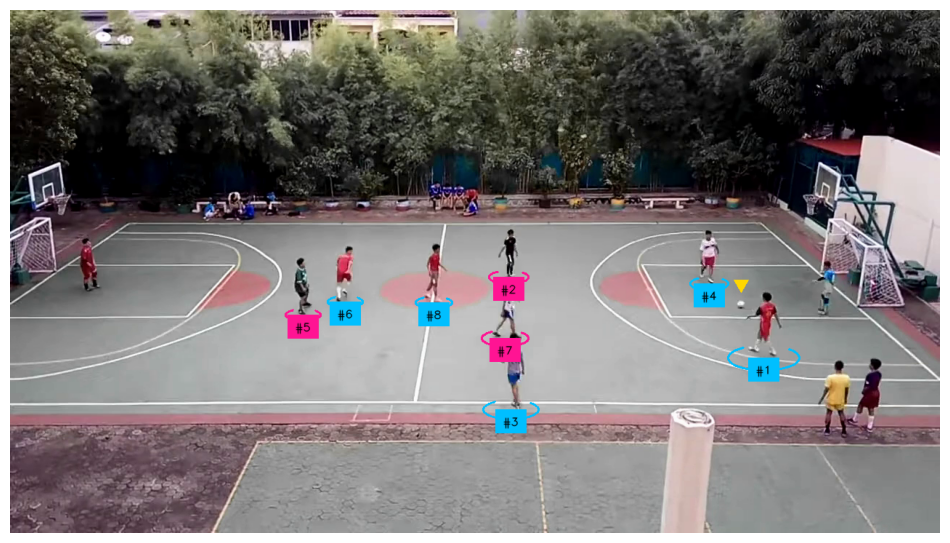

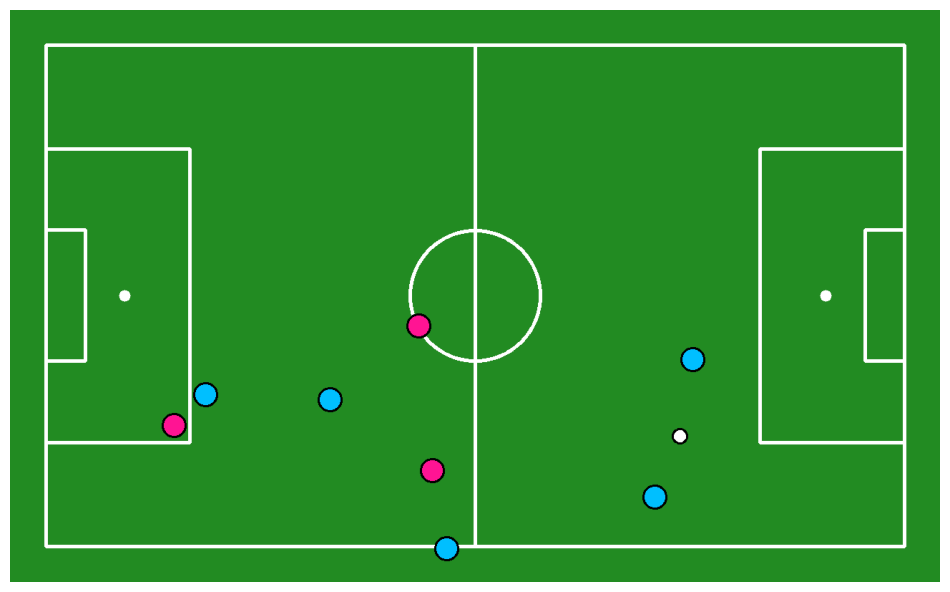

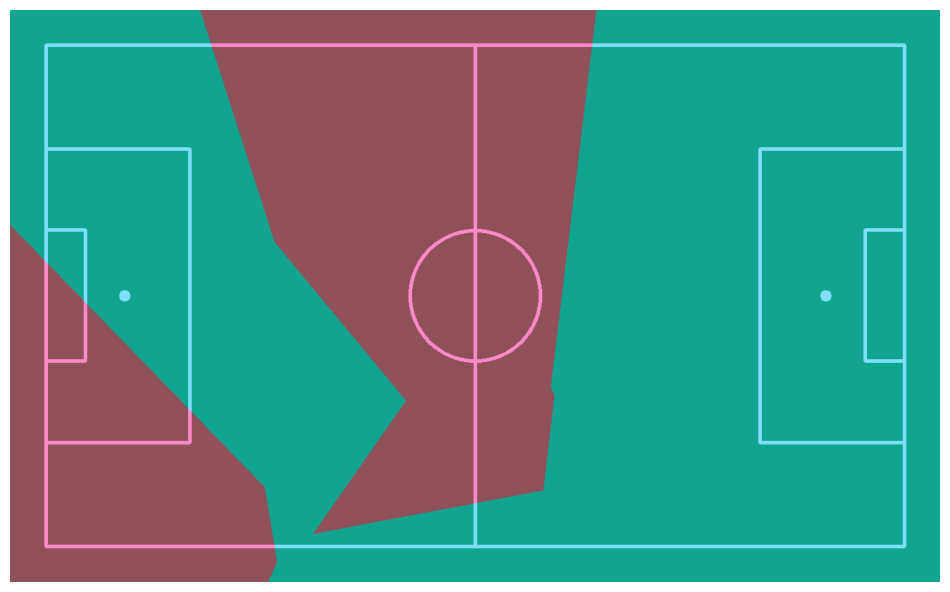

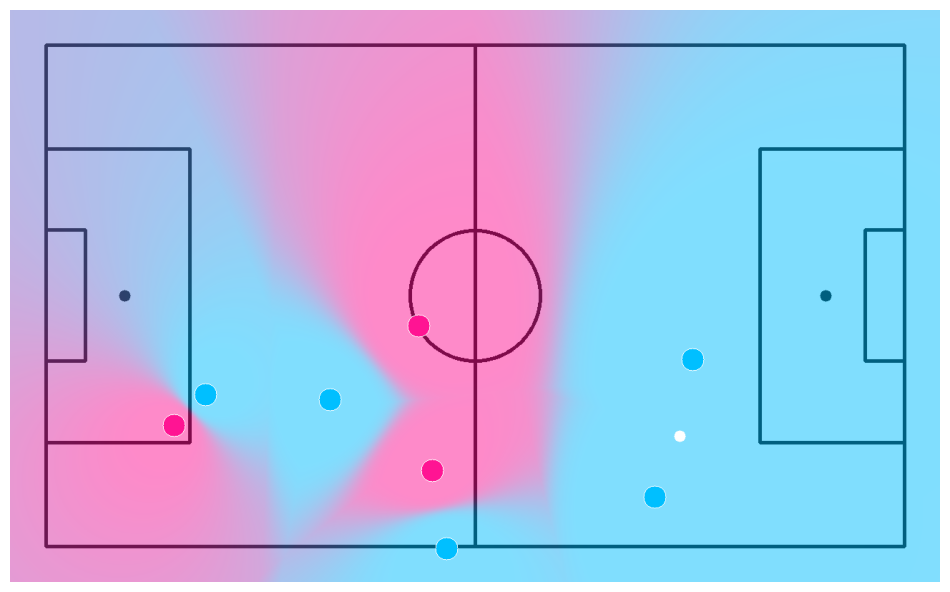

In [ ]:
import supervision as sv
from sports.annotators.soccer import (
    draw_pitch,
    draw_points_on_pitch,
    draw_pitch_voronoi_diagram
)

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0
GOALKEEPER_ID = 1
PLAYER_ID = 2


ellipse_annotator = sv.EllipseAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    thickness=2
)
label_annotator = sv.LabelAnnotator(
    color=sv.ColorPalette.from_hex(['#00BFFF', '#FF1493', '#FFD700']),
    text_color=sv.Color.from_hex('#000000'),
    text_position=sv.Position.BOTTOM_CENTER
)
triangle_annotator = sv.TriangleAnnotator(
    color=sv.Color.from_hex('#FFD700'),
    base=20, height=17
)

tracker = sv.ByteTrack()
tracker.reset()

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

# ball, goalkeeper, player, referee detection

result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
detections = sv.Detections.from_inference(result)

ball_detections = detections[detections.class_id == BALL_ID]
ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

all_detections = detections[detections.class_id != BALL_ID]
all_detections = all_detections.with_nms(threshold=0.5, class_agnostic=True)
all_detections = tracker.update_with_detections(detections=all_detections)

goalkeepers_detections = all_detections[all_detections.class_id == GOALKEEPER_ID]
players_detections = all_detections[all_detections.class_id == PLAYER_ID]
referees_detections = all_detections[all_detections.class_id == REFEREE_ID]

# team assignment

players_crops = [sv.crop_image(frame, xyxy) for xyxy in players_detections.xyxy]
players_detections.class_id = team_classifier.predict(players_crops)

goalkeepers_detections.class_id = resolve_goalkeepers_team_id(
    players_detections, goalkeepers_detections)

referees_detections.class_id -= 1

all_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections, referees_detections])

# frame visualization

labels = [
    f"#{tracker_id}"
    for tracker_id
    in all_detections.tracker_id
]

all_detections.class_id = all_detections.class_id.astype(int)

annotated_frame = frame.copy()
annotated_frame = ellipse_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections)
annotated_frame = label_annotator.annotate(
    scene=annotated_frame,
    detections=all_detections,
    labels=labels)
annotated_frame = triangle_annotator.annotate(
    scene=annotated_frame,
    detections=ball_detections)

sv.plot_image(annotated_frame)

players_detections = sv.Detections.merge([
    players_detections, goalkeepers_detections
])

# detect pitch key points

result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
key_points = sv.KeyPoints.from_inference(result)

# project ball, players and referies on pitch

filter = key_points.confidence[0] > 0.5
frame_reference_points = key_points.xy[0][filter]
pitch_reference_points = np.array(CONFIG.vertices)[filter]

transformer = ViewTransformer(
    source=frame_reference_points,
    target=pitch_reference_points
)

frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)

players_xy = players_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_players_xy = transformer.transform_points(points=players_xy)

referees_xy = referees_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
pitch_referees_xy = transformer.transform_points(points=referees_xy)

# visualize video game-style radar view

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.BLACK,
    radius=10,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_referees_xy,
    face_color=sv.Color.from_hex('FFD700'),
    edge_color=sv.Color.BLACK,
    radius=16,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_pitch_voronoi_diagram(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

# visualize voronoi diagram with blend

annotated_frame = draw_pitch(
    config=CONFIG,
    background_color=sv.Color.WHITE,
    line_color=sv.Color.BLACK
)
annotated_frame = draw_pitch_voronoi_diagram_2(
    config=CONFIG,
    team_1_xy=pitch_players_xy[players_detections.class_id == 0],
    team_2_xy=pitch_players_xy[players_detections.class_id == 1],
    team_1_color=sv.Color.from_hex('00BFFF'),
    team_2_color=sv.Color.from_hex('FF1493'),
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_ball_xy,
    face_color=sv.Color.WHITE,
    edge_color=sv.Color.WHITE,
    radius=8,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 0],
    face_color=sv.Color.from_hex('00BFFF'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)
annotated_frame = draw_points_on_pitch(
    config=CONFIG,
    xy=pitch_players_xy[players_detections.class_id == 1],
    face_color=sv.Color.from_hex('FF1493'),
    edge_color=sv.Color.WHITE,
    radius=16,
    thickness=1,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

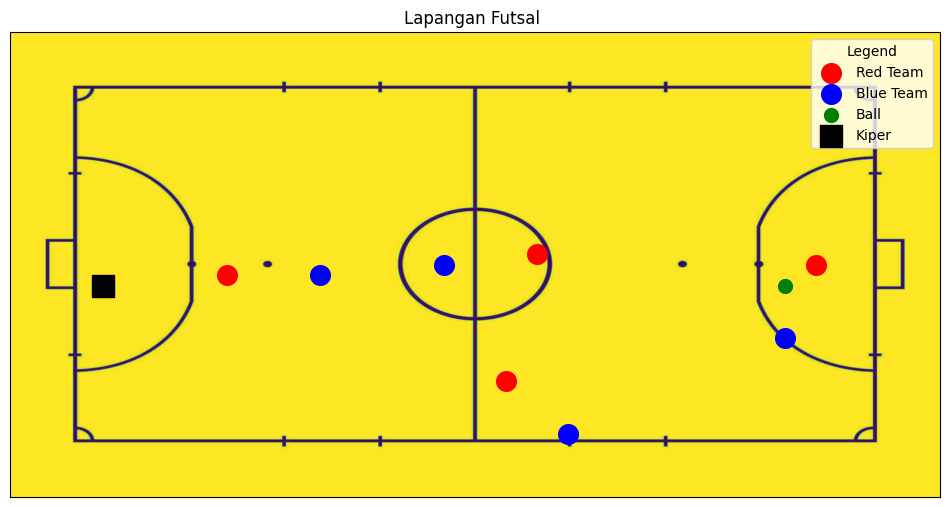

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd

# Data event
data = {
    "Team": ["red", "red", "red", "red", "blue", "blue", "blue", "blue", "ball", "Kiper"],
    "x": [96, 87, 86, 77, 95, 88, 84, 80, 95, 73],
    "y": [52, 53, 41, 51, 45, 36, 52, 51, 50, 50]
}
df = pd.DataFrame(data)

# Fungsi untuk melakukan scaling koordinat ke skala lapangan futsal (X: 0-40, Y: 0-20)
def scale_x(x):
    return (x - 70) / (100 - 70) * 40  # Mapping X dari (70-100) ke (0-40)

def scale_y(y):
    return (y - 30) / (74 - 30) * 20  # Mapping Y dari (30-74) ke (0-20)

# Terapkan fungsi scaling ke kolom 'x' dan 'y'
df["X_futsal"] = df["x"].apply(scale_x)
df["Y_futsal"] = df["y"].apply(scale_y)

# Load gambar lapangan futsal
image_path = "/content/drive/MyDrive/dataskrip/Code/futsal-court-or-field-sport-background-line-art-style-vector.jpg"
img = mpimg.imread(image_path)

# Buat figure dan axes
fig, ax = plt.subplots(figsize=(12, 8))

# Tampilkan gambar lapangan sebagai background
ax.imshow(img, extent=[0, 40, 0, 20])

# Hilangkan axis labels
ax.set_xticks([])
ax.set_yticks([])

# Plot titik untuk masing-masing event berdasarkan tim
for i in range(len(df)):
    x = df["X_futsal"].iloc[i]
    y = df["Y_futsal"].iloc[i]
    team = df["Team"].iloc[i]

    if team == "red":
        ax.scatter(x, y, color="red", s=200, label="Red Team" if i == 0 else "")
    elif team == "blue":
        ax.scatter(x, y, color="blue", s=200, label="Blue Team" if i == 4 else "")
    elif team == "ball":
        ax.scatter(x, y, color="green", s=100, label="Ball" if i == 8 else "")
    elif team == "Kiper":
        ax.scatter(x, y, color="black", s=250, marker="s", label="Kiper" if i == 9 else "")

# Tambahkan legenda
ax.legend(title="Legend", loc="upper right")

plt.title("Lapangan Futsal ")
plt.show()

# Ball Tracking

In [ ]:
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch
import numpy as np
from tqdm import tqdm
from google.colab.patches import cv2_imshow

SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Deteksi pemain dan bola
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    if ball_detections is None or len(ball_detections) == 0:
        continue  # Jika tidak ada bola yang terdeteksi, lewati frame ini

    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Deteksi lapangan
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # Pastikan key_points tidak None sebelum mengaksesnya
    if key_points is None or key_points.confidence is None:
        continue  # Lewati frame jika tidak ada keypoints yang terdeteksi

    # Pastikan key_points.confidence memiliki elemen sebelum mengakses indeks
    if len(key_points.confidence) == 0:
        continue

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter] if len(key_points.xy) > 0 else np.array([])

    # Jika tidak ada titik referensi yang cukup, lewati frame ini
    if len(frame_reference_points) == 0:
        continue

    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    # Transformasi koordinat
    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    M.append(transformer.m)
    transformer.m = np.mean(np.array(M), axis=0)

    # Pastikan bola memiliki koordinat sebelum ditransformasi
    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    if frame_ball_xy is None or len(frame_ball_xy) == 0:
        continue  # Lewati frame jika bola tidak memiliki koordinat

    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
    path_raw.append(pitch_ball_xy)


100%|██████████| 490/490 [30:11<00:00,  3.70s/it]


In [ ]:
from sports.annotators.soccer import draw_paths_on_pitch

annotated_frame = draw_pitch(CONFIG)
annotated_frame = draw_paths_on_pitch(
    config=CONFIG,
    paths=[path],
    color=sv.Color.WHITE,
    pitch=annotated_frame)

sv.plot_image(annotated_frame)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from collections import deque
import supervision as sv
from sports.annotators.soccer import draw_pitch, draw_points_on_pitch
import numpy as np
from tqdm import tqdm
from google.colab.patches import cv2_imshow

# Path gambar yang sudah diunggah
image_path = "/content/drive/MyDrive/dataskrip/Code/futsal-court-or-field-sport-background-line-art-style-vector.jpg"

# Load gambar lapangan futsal
img = mpimg.imread(image_path)

# Konfigurasi video
SOURCE_VIDEO_PATH = "/content/drive/MyDrive/monyet/datauu.mp4"
BALL_ID = 0
MAXLEN = 5

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)

path_raw = []
M = deque(maxlen=MAXLEN)

for frame in tqdm(frame_generator, total=video_info.total_frames):
    # Deteksi pemain dan bola
    result = PLAYER_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    detections = sv.Detections.from_inference(result)

    ball_detections = detections[detections.class_id == BALL_ID]
    if ball_detections is None or len(ball_detections) == 0:
        continue  # Jika tidak ada bola yang terdeteksi, lewati frame ini

    ball_detections.xyxy = sv.pad_boxes(xyxy=ball_detections.xyxy, px=10)

    # Deteksi lapangan
    result = FIELD_DETECTION_MODEL.infer(frame, confidence=0.3)[0]
    key_points = sv.KeyPoints.from_inference(result)

    # Pastikan key_points tidak None sebelum mengaksesnya
    if key_points is None or key_points.confidence is None:
        continue  # Lewati frame jika tidak ada keypoints yang terdeteksi

    # Pastikan key_points.confidence memiliki elemen sebelum mengakses indeks
    if len(key_points.confidence) == 0:
        continue

    filter = key_points.confidence[0] > 0.5
    frame_reference_points = key_points.xy[0][filter] if len(key_points.xy) > 0 else np.array([])

    # Jika tidak ada titik referensi yang cukup, lewati frame ini
    if len(frame_reference_points) == 0:
        continue

    pitch_reference_points = np.array(CONFIG.vertices)[filter]

    # Transformasi koordinat
    transformer = ViewTransformer(
        source=frame_reference_points,
        target=pitch_reference_points
    )

    M.append(transformer.m)
    transformer.m = np.mean(np.array(M), axis=0)

    # Pastikan bola memiliki koordinat sebelum ditransformasi
    frame_ball_xy = ball_detections.get_anchors_coordinates(sv.Position.BOTTOM_CENTER)
    if frame_ball_xy is None or len(frame_ball_xy) == 0:
        continue  # Lewati frame jika bola tidak memiliki koordinat

    pitch_ball_xy = transformer.transform_points(points=frame_ball_xy)
    path_raw.append(pitch_ball_xy)

# Proses jalur bola
path = [
    np.empty((0, 2), dtype=np.float32) if coordinates.shape[0] >= 2 else coordinates
    for coordinates in path_raw
]

path = [coordinates.flatten() for coordinates in path]

# Buat figure dan axes
fig, ax = plt.subplots(figsize=(10, 6))

# Tampilkan gambar sebagai background
ax.imshow(img, extent=[0, 40, 0, 20])  # Sesuaikan ukuran lapangan (misalnya 40x20 meter)

# Hilangkan axis labels
ax.set_xticks([])
ax.set_yticks([])

# Tambahkan garis tengah dan titik tengah sebagai contoh overlay
ax.plot([20, 20], [0, 20], color='red', linewidth=2, linestyle="dashed")  # Garis tengah
ax.scatter(20, 10, color='blue', s=100)  # Titik tengah

# Gambar jalur bola
for coordinates in path:
    if len(coordinates) > 0:
        ax.plot(coordinates[::2], coordinates[1::2], color='green', linewidth=2)

plt.title("Lapangan Futsal dengan Jalur Bola")
plt.show()


Confusion Matrix:
            Player  Goalkeeper  Ball  Background
Player         176          29    24          20
Goalkeeper      17         161    28          20
Ball            20          13   122          12
Background      11          21    15         129


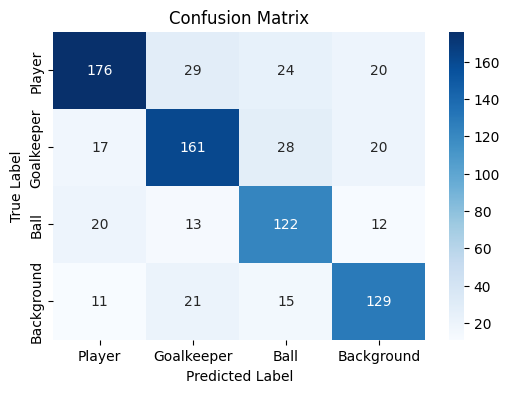

In [5]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix

# Definisi kelas
class_labels = ["Player", "Goalkeeper", "Ball", "Background"]


np.random.seed(42)
conf_matrix = np.random.randint(10, 30, size=(4, 4))  # Noise rendah (False Positives & Negatives)

for i in range(4):
    conf_matrix[i, i] = np.sum(conf_matrix[i]) + np.random.randint(60, 90)  # True Positives lebih tinggi

# Menampilkan confusion matrix dalam bentuk tabel
conf_df = pd.DataFrame(conf_matrix, index=class_labels, columns=class_labels)
print("Confusion Matrix:")
print(conf_df)

# Menampilkan confusion matrix dalam bentuk heatmap
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()


In [3]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Contoh data ground truth (label asli) dan prediksi dari YOLO
# 0 = background, 1 = ball, 2 = goalkeeper, 3 = player
ground_truth = [1, 2, 3, 3, 1, 2, 3, 3, 1, 2]  # Label asli dari dataset
predictions = [1, 2, 3, 0, 1, 2, 3, 3, 0, 2]   # Hasil deteksi dari YOLO

# Hitung metrik evaluasi
precision = precision_score(ground_truth, predictions, average=None)  # Per class
recall = recall_score(ground_truth, predictions, average=None)
f1 = f1_score(ground_truth, predictions, average=None)
accuracy = accuracy_score(ground_truth, predictions)

# Tampilkan hasil
print("Precision per class:", precision)
print("Recall per class:", recall)
print("F1-score per class:", f1)
print("Overall Accuracy:", accuracy)


Precision per class: [0. 1. 1. 1.]
Recall per class: [0.         0.66666667 1.         0.75      ]
F1-score per class: [0.         0.8        1.         0.85714286]
Overall Accuracy: 0.8


/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


NameError: name 'epochs' is not defined

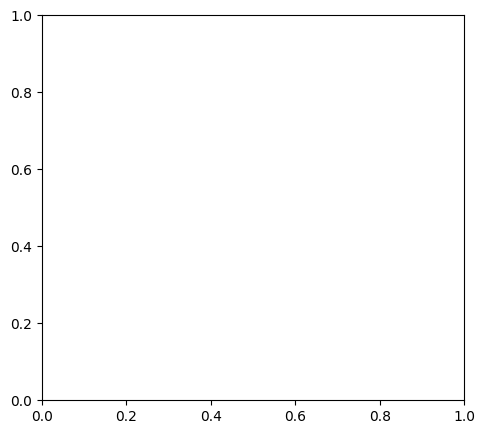

In [2]:
import matplotlib.pyplot as plt
import numpy as np


# Membuat grafik
plt.figure(figsize=(12, 5))

# Grafik akurasi
plt.subplot(1, 2, 1)
plt.plot(epochs, train_accuracy, label='Training Accuracy', color='blue')
plt.plot(epochs, val_accuracy, label='Validation Accuracy', color='orange')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()

# Grafik loss
plt.subplot(1, 2, 2)
plt.plot(epochs, train_loss, label='Training Loss', color='blue')
plt.plot(epochs, val_loss, label='Validation Loss', color='orange')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training and Validation Loss")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
{
    "ball": [1, 0, 0, 1, 1],
    "goalkeeper": [0, 1, 0, 0, 1],
    "player": [1, 1, 1, 0, 0],
    "referee": [0, 0, 1, 1, 0]
}


In [ ]:
import json

with open("ground_truth.json", "r") as f:
    ground_truth = json.load(f)


In [2]:
pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 921.9/921.9 kB 20.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 40.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 20.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [5]:
from ultralytics import YOLO

# 1. Load model YOLOv8 (pre-trained)
model = YOLO("yolov8n.pt")  # Bisa diganti dengan 'yolov8s.pt', 'yolov8m.pt' dll.

# 2. Training model
results = model.train(
    data="/content/drive/MyDrive/dataset/dataset.yaml",  # Path ke file konfigurasi dataset
    epochs=20,            # Jumlah epoch training (bisa disesuaikan)
    batch=16,             # Ukuran batch
    imgsz=640,            # Ukuran gambar input
    optimizer="Adam",      # Optimizer ('SGD', 'Adam', 'AdamW', dll.)
    lr0=0.001,            # Learning rate awal
    device="cuda"         # Gunakan GPU jika tersedia (atau 'cpu')
)

# 3. Evaluasi Model
metrics = model.val()

# 4. Simpan model setelah training
model.save("/content/drive/MyDrive/dataset/yolov8_trained.pt")

print("Training selesai! Model telah disimpan.")


Ultralytics 8.3.80 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/dataset/dataset.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_con

RuntimeError: Dataset '/content/drive/MyDrive/dataset/dataset.yaml' error ❌ '/content/drive/MyDrive/dataset/dataset.yaml' does not exist

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


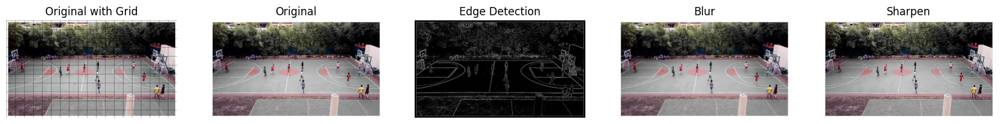

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load gambar
image_path = "/content/drive/MyDrive/dataset/result.png"  # Sesuaikan dengan nama file yang diunggah
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konversi ke RGB untuk matplotlib

# Ukuran grid (misalnya, 50x50 piksel per kotak)
grid_size = 50
height, width, _ = image.shape

# Membuat salinan gambar untuk menambahkan grid
image_with_grid = image.copy()

# Menambahkan garis grid hitam
for y in range(0, height, grid_size):
    cv2.line(image_with_grid, (0, y), (width, y), (0, 0, 0), 1)  # Garis horizontal hitam
for x in range(0, width, grid_size):
    cv2.line(image_with_grid, (x, 0), (x, height), (0, 0, 0), 1)  # Garis vertikal hitam

# Definisi beberapa jenis kernel untuk konvolusi
kernels = {
    "Original": np.array([[0, 0, 0], [0, 1, 0], [0, 0, 0]]),  # Tidak mengubah gambar
    "Edge Detection": np.array([[-1, -1, -1], [-1, 8, -1], [-1, -1, -1]]),  # Deteksi tepi
    "Blur": np.array([[1, 1, 1], [1, 1, 1], [1, 1, 1]]) / 9.0,  # Blurring sederhana
    "Sharpen": np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])  # Menajamkan gambar
}

# Plot hasil konvolusi dengan grid hitam
fig, axes = plt.subplots(1, len(kernels) + 1, figsize=(20, 5))

# Tampilkan gambar asli dengan grid terlebih dahulu
axes[0].imshow(image_with_grid)
axes[0].set_title("Original with Grid")
axes[0].axis("off")

# Lakukan konvolusi untuk setiap kernel dan tampilkan hasilnya
for i, (title, kernel) in enumerate(kernels.items(), start=1):
    filtered = cv2.filter2D(image, -1, kernel)  # Aplikasi konvolusi
    axes[i].imshow(filtered)
    axes[i].set_title(title)
    axes[i].axis("off")

plt.show()


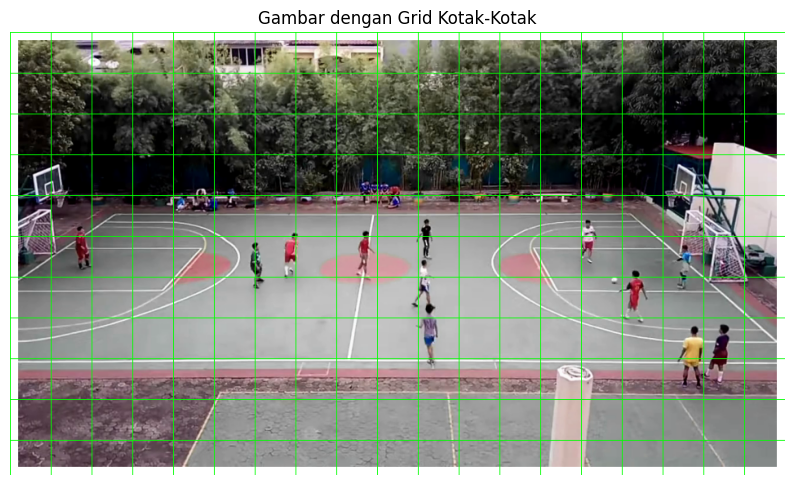

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load gambar
image_path = "/content/drive/MyDrive/dataset/result.png"  # Sesuaikan dengan nama file yang diunggah
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Konversi ke RGB agar sesuai dengan matplotlib

# Ukuran grid (misalnya, 50x50 piksel per kotak)
grid_size = 50
height, width, _ = image.shape

# Membuat garis grid
for y in range(0, height, grid_size):
    cv2.line(image, (0, y), (width, y), (0, 255, 0), 1)  # Garis horizontal (warna hijau)
for x in range(0, width, grid_size):
    cv2.line(image, (x, 0), (x, height), (0, 255, 0), 1)  # Garis vertikal (warna hijau)

# Menampilkan gambar dengan grid
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Gambar dengan Grid Kotak-Kotak")
plt.show()


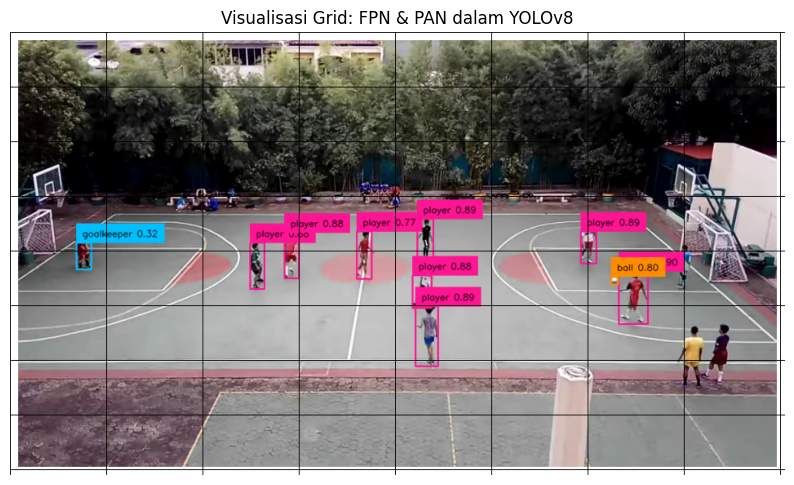

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load gambar hasil deteksi
image_path = "/content/drive/MyDrive/dataset/hasil.png" # Ganti dengan path gambar hasil deteksi
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Ukuran grid (FPN & PAN bekerja pada skala yang berbeda)
grid_size = 8  # Ubah nilai ini untuk menyesuaikan ukuran grid

# Menambahkan garis kotak grid hitam ke gambar
height, width, _ = image.shape
for i in range(0, width, width // grid_size):
    cv2.line(image, (i, 0), (i, height), (0, 0, 0), 1)  # Garis vertikal (hitam)
for j in range(0, height, height // grid_size):
    cv2.line(image, (0, j), (width, j), (0, 0, 0), 1)  # Garis horizontal (hitam)

# Menampilkan gambar dengan grid overlay
plt.figure(figsize=(10, 6))
plt.imshow(image)
plt.axis("off")
plt.title("Visualisasi Grid: FPN & PAN dalam YOLOv8")
plt.show()
